In [209]:
#from google.colab import drive
#drive.mount('/content/drive')

# Loading Libraries

In [210]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling as pp
import math
from scipy.stats import mstats
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.metrics import classification_report, accuracy_score

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

# Loading DataSet

In [211]:
#bankdata = pd.read_csv('drive/MyDrive/DSProject/bank_marketing.csv')
bankdata = pd.read_csv('bank_marketing.csv')

In [212]:
bankdata

,banking marketing,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18
0,customer id and age.,NaN,Customer salary and balance.,NaN,Customer marital status and job with education...,NaN,particular customer before targeted or not,NaN,Loan types: loans or housing loans,NaN,Contact type,NaN,month of contact,duration of call,NaN,NaN,NaN,outcome of previous contact,response of customer after call happned
1,customerid,age,salary,balance,marital,jobedu,targeted,default,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,response
2,1,58,100000,2143,married,"management,tertiary",yes,no,yes,no,unknown,5,"may, 2017",261 sec,1,-1,0,unknown,no
3,2,44,60000,29,single,"technician,secondary",yes,no,yes,no,unknown,5,"may, 2017",151 sec,1,-1,0,unknown,no
4,3,33,120000,2,married,"entrepreneur,secondary",yes,no,yes,yes,unknown,5,"may, 2017",76 sec,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45208,45207,51.0,60000,825,married,"technician,tertiary",yes,no,no,no,cellular,17,"nov, 2017",16.2833333333333 min,3,-1,0,unknown,yes
45209,45208,71.0,55000,1729,divorced,"retired,primary",yes,no,no,no,cellular,17,"nov, 2017",7.6 min,2,-1,0,unknown,yes
45210,45209,72.0,55000,5715,married,"retired,secondary",yes,no,no,no,cellular,17,"nov, 2017",18.7833333333333 min,5,184,3,success,yes
45211,45210,57.0,20000,668,married,"blue-collar,secondary",yes,no,no,no,telephone,17,"nov, 2017",8.46666666666667 min,4,-1,0,unknown,no


# Load and Manipulate Data

In [213]:
#Data Cleaning

bankdata.rename(columns={'banking marketing':'Customerid','Unnamed: 1':'Age','Unnamed: 2':'Salary','Unnamed: 3':'Balance','Unnamed: 4':'MaritalStatus','Unnamed: 5':'Job,Education','Unnamed: 6':'Targeted','Unnamed: 7':'Default','Unnamed: 8':'HousingLoan','Unnamed: 9':'OtherLoan','Unnamed: 10':'Contact','Unnamed: 11':'ContactDay','Unnamed: 12':'ContactMonth','Unnamed: 13':'ContactDuration','Unnamed: 14':'Campaign','Unnamed: 15':'PDays','Unnamed: 16':'PreviousContact','Unnamed: 17':'PCOutcome','Unnamed: 18':'Response'}, inplace=True)
bankdata = bankdata.iloc[2: , :]
new = bankdata["Job,Education"].str.split(",", n = 1, expand = True)
# new data frame with split value columns
# making separate first name column from new data frame
bankdata["Job"]= new[0]
 
# making separate last name column from new data frame
bankdata["Education"]= new[1]
 
# Dropping old Name columns
bankdata.drop(columns =["Job,Education"], inplace = True)

new = bankdata["ContactMonth"].str.split(",", n = 1, expand = True)
# new data frame with split value columns
# making separate first name column from new data frame
bankdata["Month"]= new[0]
 
# making separate last name column from new data frame
bankdata["Year"]= new[1]
 
# Dropping old Name column
bankdata.drop(columns =["ContactMonth"], inplace = True)

# Dropping Customerid(Not Required) and Year(Consists of single value i.e. 2017)
bankdata = bankdata.drop(['Customerid', 'Year'], axis=1)

#Removing Null values from Age
bankdata['Age']=bankdata['Age'].astype("float64")
value=round(bankdata['Age'].mean())
bankdata['Age'].fillna(value,inplace=True)

#Removing Null Values from month
bankdata['Month']=bankdata['Month'].interpolate(method="pad", limit=50)

#Drop Rows where Responce is null
bankdata=bankdata[~bankdata.Response.isna()]

#Converting Columns datatype
bankdata["Age"] = pd.to_numeric(bankdata["Age"])

#Converting all time values of ContactDuration into Seconds
def processTime(a):
  a=str(a)
  if 'min' in a:
    return float(a.split()[0])*60
  else:
    return a.split()[0]  
bankdata['ContactDuration']=bankdata['ContactDuration'].apply(processTime)
bankdata['ContactDuration']


2           261
3           151
4            76
5            92
6           198
          ...  
45208     977.0
45209     456.0
45210    1127.0
45211     508.0
45212     361.0
Name: ContactDuration, Length: 45181, dtype: object

In [214]:
bankdata.head().style.background_gradient(cmap = "Reds").set_properties(**{"font-family" : "Segoe UI"}).hide_index()

Age,Salary,Balance,MaritalStatus,Targeted,Default,HousingLoan,OtherLoan,Contact,ContactDay,ContactDuration,Campaign,PDays,PreviousContact,PCOutcome,Response,Job,Education,Month
58.000000,100000,2143,married,yes,no,yes,no,unknown,5,261,1,-1,0,unknown,no,management,tertiary,may
44.000000,60000,29,single,yes,no,yes,no,unknown,5,151,1,-1,0,unknown,no,technician,secondary,may
33.000000,120000,2,married,yes,no,yes,yes,unknown,5,76,1,-1,0,unknown,no,entrepreneur,secondary,may
47.000000,20000,1506,married,no,no,yes,no,unknown,5,92,1,-1,0,unknown,no,blue-collar,unknown,may
33.000000,0,1,single,no,no,no,no,unknown,5,198,1,-1,0,unknown,no,unknown,unknown,may


In [215]:
#Know the value counts of columns for analyzing data
print("Job:",bankdata.Job.value_counts(),sep = '\n')
print("-"*40)
print("Age:",bankdata.Age.value_counts(),sep = '\n')
print("-"*40)
print("Education:",bankdata.Education.value_counts(),sep = '\n')
print("-"*40)
print("Campaign:",bankdata.Campaign.value_counts(),sep = '\n')
print("-"*40)
print("Housing Loan:",bankdata.HousingLoan.value_counts(),sep = '\n')
print("-"*40)
print("Month:",bankdata.Month.value_counts(),sep = '\n')
print("-"*40)
print("Contact:",bankdata.Contact.value_counts(),sep = '\n')
print("-"*40)
print("Day:",bankdata.ContactDay.value_counts(),sep = '\n')
print("-"*40)
print("Salary:",bankdata.Salary.value_counts(),sep = '\n')
print("-"*40)
print("Previous outcome:",bankdata.PCOutcome.value_counts(),sep = '\n')
print("-"*40)
print("Outcome of this campaign - Response:",bankdata.Response.value_counts(),sep = '\n')
print("-"*40)

Job:
blue-collar      9727
management       9454
technician       7592
admin.           5166
services         4150
retired          2263
self-employed    1575
entrepreneur     1486
unemployed       1303
housemaid        1239
student           938
unknown           288
Name: Job, dtype: int64
----------------------------------------
Age:
32.0    2084
31.0    1989
33.0    1971
34.0    1928
35.0    1891
        ... 
93.0       2
90.0       2
95.0       2
88.0       2
94.0       1
Name: Age, Length: 77, dtype: int64
----------------------------------------
Education:
secondary    23189
tertiary     13292
primary       6844
unknown       1856
Name: Education, dtype: int64
----------------------------------------
Campaign:
1     11494
2      9244
1      6038
3      4093
2      3256
      ...  
17        1
39        1
23        1
58        1
46        1
Name: Campaign, Length: 66, dtype: int64
----------------------------------------
Housing Loan:
yes    25112
no     20069
Name: HousingLoan, 

In [216]:
#Factorize 'Job','Education','Month','MaritalStatus','HousingLoan','Response','Default','Targeted','OtherLoan','Contact','PCOutcome'
cat_colums=bankdata.columns
cat_colums=['Job','Education','Month','MaritalStatus','HousingLoan','Response','Default','Targeted','OtherLoan','Contact','PCOutcome']
bankdata[cat_colums]=bankdata[cat_colums].apply(lambda x:pd.factorize(x)[0])

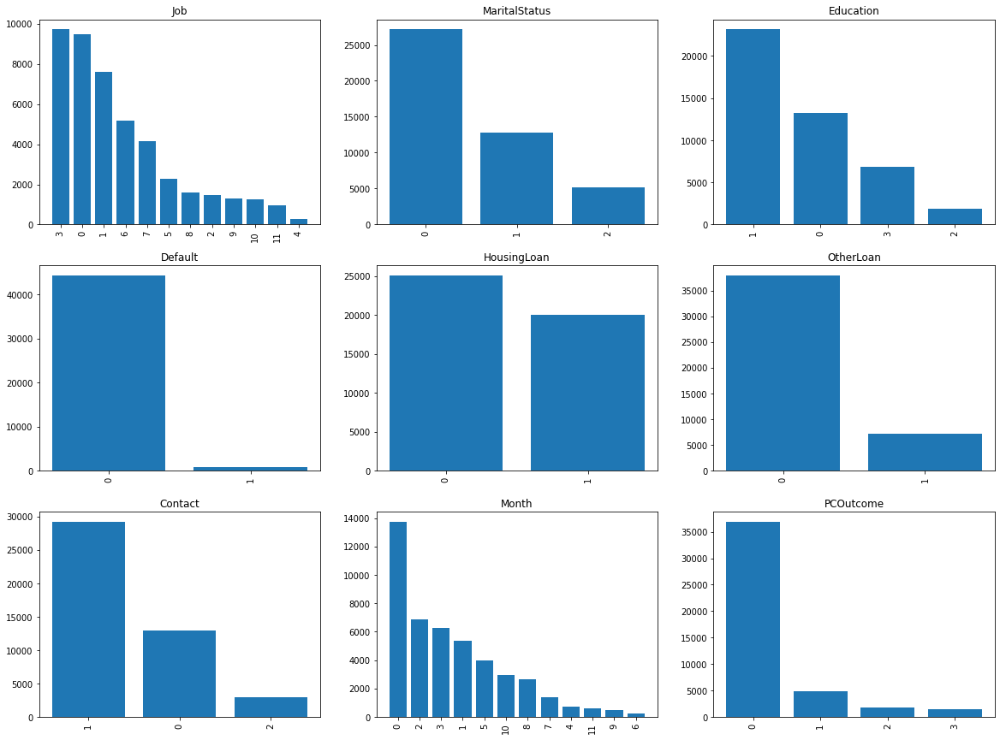

In [217]:
# To show the relationship between all the String Columns
cat_columns = ['Job', 'MaritalStatus', 'Education', 'Default', 'HousingLoan', 'OtherLoan', 'Contact', 'Month','PCOutcome']

fig, axs = plt.subplots(3, 3, sharex=False, sharey=False, figsize=(20, 15))

counter = 0
for cat_column in cat_columns:
    value_counts = bankdata[cat_column].value_counts()
    
    trace_x = counter // 3
    trace_y = counter % 3
    x_pos = np.arange(0, len(value_counts))
    
    axs[trace_x, trace_y].bar(x_pos, value_counts.values, tick_label = value_counts.index)
    
    axs[trace_x, trace_y].set_title(cat_column)
    
    for tick in axs[trace_x, trace_y].get_xticklabels():
        tick.set_rotation(90)
    
    counter += 1

plt.show()

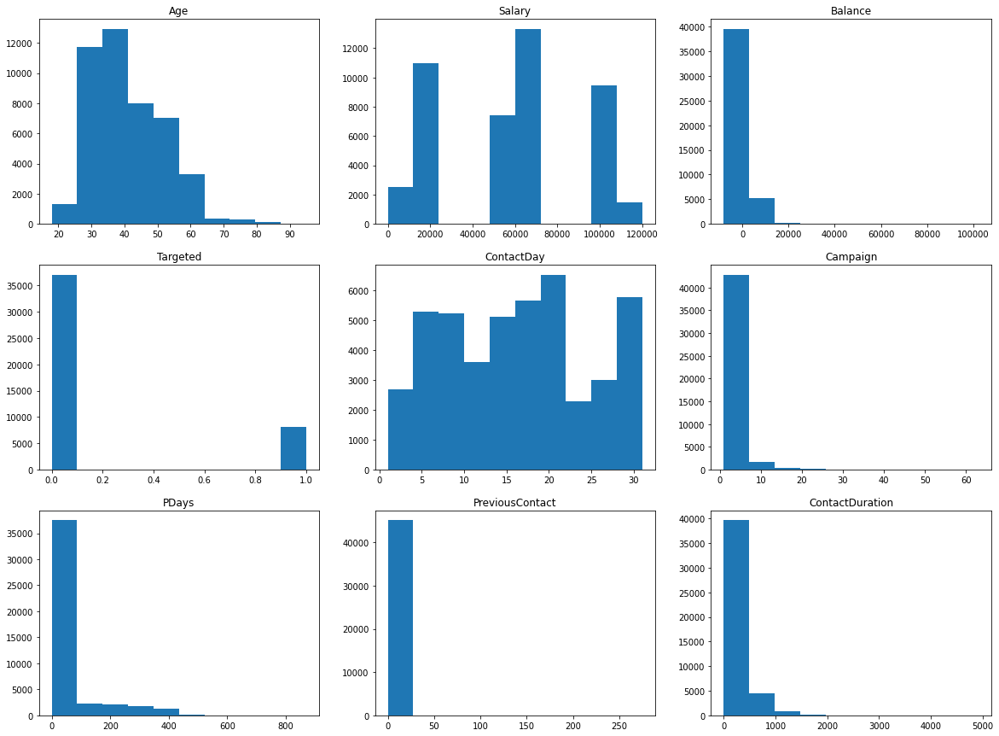

In [218]:
# To show the relationship between all the numeric columns
num_columns = ['Age','Salary','Balance','Targeted','ContactDay', 'Campaign', 'PDays', 'PreviousContact','ContactDuration']

fig, axs = plt.subplots(3,3 , sharex=False, sharey=False, figsize=(20, 15))

counter = 0
for num_column in num_columns:
    bankdata[num_column] = pd.to_numeric(bankdata[num_column])
    
    trace_x = counter // 3
    trace_y = counter % 3
    
    axs[trace_x, trace_y].hist(bankdata[num_column])
    
    axs[trace_x, trace_y].set_title(num_column)
    
    counter += 1

plt.show()

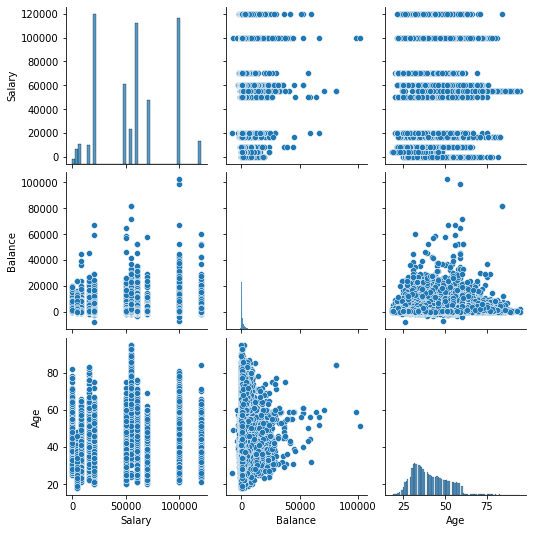

In [219]:
#plot the pair plot of salary, balance and age in inp1 dataframe.
sns.pairplot(data=bankdata,vars=['Salary','Balance','Age'])
plt.show()

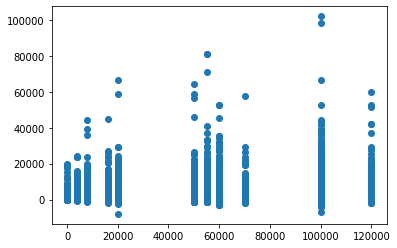

In [220]:
#bankdata scatter plot salary & balance
plt.scatter(bankdata.Salary, bankdata.Balance)
plt.show()

Pandas Profiling

In [221]:
pp.ProfileReport(bankdata)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

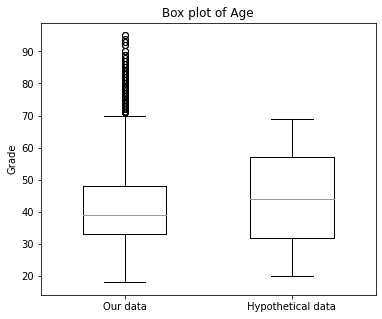

In [222]:
# Remove outliers
fig = plt.figure(figsize=(6,5))
hypo = np.random.randint(20, 70, size=45213)
plt.boxplot([bankdata["Age"], hypo], widths=0.5)
plt.xticks([1,2],['Our data', 'Hypothetical data'])
plt.ylabel('Grade')
plt.title('Box plot of Age')
plt.show()

As we can see that there are outliers after the age above 70 

Hence we will remove the data of the people age 70. 

And usually people with age above 70 don't get insurance

Outliers are the data points that differ from other observations or those which lie at a distance from the other data. 

They are mainly generated due to some experimental error which may cause several problems in statistical analysis. 

#### Applying Outlier(Removed afterwards)

Q1 = np.percentile(bankdata["Age"] , 20)

Q3 = np.percentile(bankdata["Age"] , 70)

Q1,Q3 = np.percentile(bankdata["Age"] , [20,70])

Find IQR, upper limit, lower limit

IQR = Q3 - Q1 #Interquartile range

ul = Q3+1.5*IQR

ll = Q1-1.5*IQR

Find outliers

outliers = bankdata["Age"][(bankdata["Age"] > ul) | (bankdata["Age"] < ll)]

print(outliers.count())

Remove Outliers

Q1 = bankdata.quantile(0.20)

Q3 = bankdata.quantile(0.70)

IQR = Q3 - Q1

bankdata = bankdata[~((bankdata < (Q1 - 1.5 * IQR)) |(bankdata> (Q3 + 1.5 * IQR))).any(axis=1)]

Result of applying outlier was that number of outliers count came 632 and when applied to data only 16109 rows out of 45181 rows were left to use for classification and solver require at least 2 classes in the data, but the data contains only one class: 0.

KNN Started showing 100% Accuracy

In [223]:
#Salary Feature/Column
# Remove rows where salary is 0
bankdata.drop(bankdata.index[bankdata['Salary'] == '0'], inplace=True)
bankdata["Salary"].unique()


array([100000,  60000, 120000,  20000,      0,  55000,  50000,  70000,
         8000,  16000,   4000], dtype=int64)

In [224]:
#Balance Feature/Column
# Remove rows where bank balance <= 0
bankdata["Balance"] = pd.to_numeric(bankdata["Balance"])
bankdata.drop(bankdata.index[bankdata['Balance'] <= 0 ], inplace=True)
bankdata["Balance"].unique()
#Remove rows where balance is Yes
bankdata = bankdata[bankdata['Default'] == 0] 

Salary Feature/Column

Removing rows where Salary is equal to 0
288

bankdata.drop(bankdata.index[bankdata['Salary'] == '0'], inplace=True)

bankdata["Salary"].count()
44893


Default Feature/Column

Default list is the list of people who are blacklisted by the bank, therefore; would not be any use in offereing them any type of marketing.

Hence, lets delete all rows where Default is yes

print("Default:",bankdata.Default.value_counts(),sep = '\n')
print("-"*40)

Default:

0    44366

1      815

Name: Default, dtype: int64

bankdata = bankdata[bankdata['Default'] == 0] 
Number of rows left are 44366

Logistics Regression 

Accuracy after data is cleaned 88.4570726043303

Confusion Matrix after data is cleaned:  [[12643   239]

 [ 1451   308]]

Accuracy after data is cleaned where Solver used is newton-cg: 89.67966668943377

Confusion Matrix after data is cleaned where Solver used is newton-cg:  [[12587   295]

 [ 1216   543]]

KNN Classification

Accuracy after data is cleaned with KNN:  88.3751109896865

Accuracy with KNN considering n_neighbours = 4000 :  87.98579332012841

Month Feature/Column Drop 

bankdata = bankdata.drop(['Month'], axis=1)

Effects on Logistic Regression

Accuracy after data is cleaned 88.34339369550636

Confusion Matrix after data is cleaned: 
 
 [[12909   201]
 
 [ 1537   263]]

 Effects on KNN Classification
 
 Accuracy after data is cleaned with KNN:  88.2562038900067


# Data Visualization

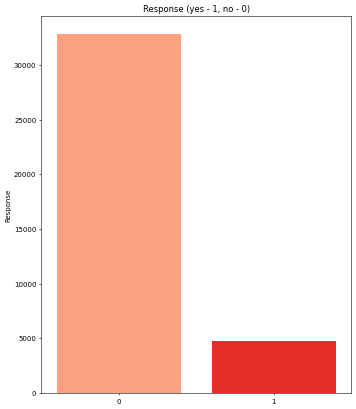

In [225]:
plt.figure(figsize = (8, 10), dpi = 50, edgecolor = "black")

sns.barplot(x = bankdata["Response"].value_counts().index,
            y = bankdata["Response"].value_counts(),
            data = bankdata, palette = "Reds", saturation = 1).set(title = "Response (yes - 1, no - 0)");

In [226]:
bankdata.head().style.background_gradient(cmap = "Reds_r")

,Age,Salary,Balance,MaritalStatus,Targeted,Default,HousingLoan,OtherLoan,Contact,ContactDay,ContactDuration,Campaign,PDays,PreviousContact,PCOutcome,Response,Job,Education,Month
2,58.000000,100000,2143,0,0,0,0,0,0,5,261.000000,1,-1,0,0,0,0,0,0
3,44.000000,60000,29,1,0,0,0,0,0,5,151.000000,1,-1,0,0,0,1,1,0
4,33.000000,120000,2,0,0,0,0,1,0,5,76.000000,1,-1,0,0,0,2,1,0
5,47.000000,20000,1506,0,1,0,0,0,0,5,92.000000,1,-1,0,0,0,3,2,0
6,33.000000,0,1,1,1,0,1,0,0,5,198.000000,1,-1,0,0,0,4,2,0


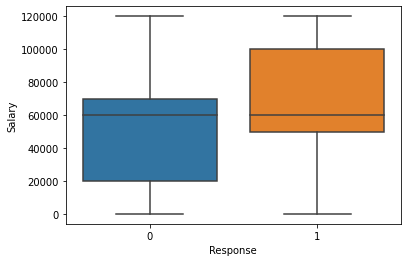

In [227]:
#plot the box plot of salary for yes & no responses.
sns.boxplot(data=bankdata,x='Response',y='Salary')
plt.show()

In [228]:
#function to find the 70th percentile.
def percentile(x):
    return np.quantile(x, 0.70)
bankdata.groupby("Response")['Salary'].aggregate(["mean","median",percentile]) 

,mean,median,percentile
Response,,,
0,56704.440389,60000.0,70000.0
1,58836.619128,60000.0,70000.0


In [229]:
#groupby the education to find the median of the salary for each education category.
bankdata.groupby("Education")["Salary"].mean()

Education
0    82484.310451
1    49375.755982
2    46368.156073
3    34231.868714
Name: Salary, dtype: float64

In [230]:
#groupby the response to find the mean of the balance with response no & yes seperatly.
bankdata.groupby("Response")['Balance'].mean()

Response
0    1614.134976
1    2013.042366
Name: Balance, dtype: float64

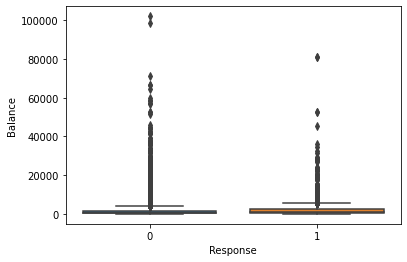

In [231]:
#plot the box plot of balance for yes & no responses.
sns.boxplot(data=bankdata,x='Response',y='Balance')
plt.show()

In [232]:
#function to find the 70th percentile.
def percentile(x):
    return np.quantile(x, 0.70)
bankdata.groupby("Response")['Balance'].aggregate(["mean","median",percentile])    

,mean,median,percentile
Response,,,
0,1614.134976,623.0,1360.0
1,2013.042366,921.0,1970.0


In [233]:
#calculate the mean of Response with different education categories.
bankdata.groupby("Education")["Response"].mean() *100

Education
0    15.970818
1    11.464633
2    15.292637
3     9.317099
Name: Response, dtype: float64

In [234]:
#calculate the mean of response with different marital status categories.
bankdata.groupby("MaritalStatus")["Response"].mean() * 100

MaritalStatus
0    11.020589
1    16.028861
2    12.736996
Name: Response, dtype: float64

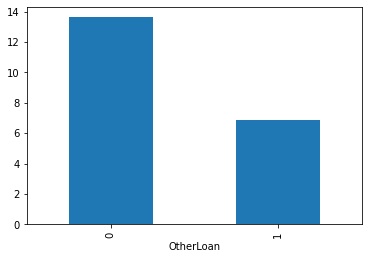

In [235]:
#plot the bar graph of other loan status with average value of response
(bankdata.groupby("OtherLoan")["Response"].mean()*100).plot.bar()
plt.show()

<AxesSubplot:xlabel='HousingLoan'>

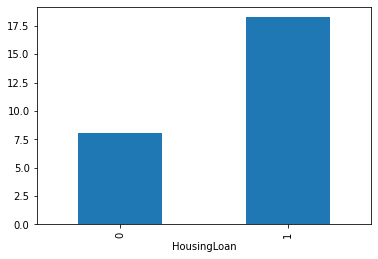

In [236]:
#plot the bar graph of housing loan status with average value of response
(bankdata.groupby("HousingLoan")["Response"].mean()*100).plot.bar()

<AxesSubplot:xlabel='Response', ylabel='Age'>

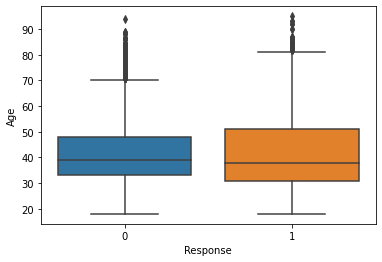

In [237]:
#plot the boxplot of age with response
sns.boxplot(data=bankdata,x='Response',y='Age')

<AxesSubplot:xlabel='Response', ylabel='ContactDuration'>

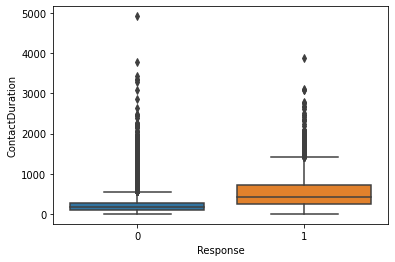

In [238]:
#plot the boxplot of ContactDuration with response
sns.boxplot(data=bankdata,x='Response',y='ContactDuration')

<AxesSubplot:xlabel='ContactDuration'>

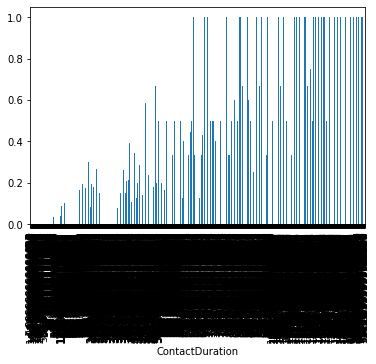

In [239]:
#plot the bar of ContactDuration with response
(bankdata.groupby("ContactDuration")["Response"].mean()).plot.bar()

<AxesSubplot:xlabel='PCOutcome'>

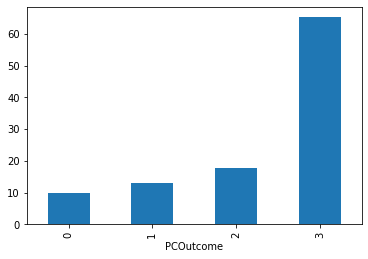

In [240]:
#plot the bar of ContactDuration with response
(bankdata.groupby("PCOutcome")["Response"].mean()*100).plot.bar()

# Model

In [241]:
#Train and Test Data based on Response
X=bankdata.drop(['Response'],axis=1)
y=bankdata['Response']
X_train, X_test,y_train, y_test = train_test_split(X,y,test_size=0.33, random_state=42)

In [242]:
# logistic regression
logreg = LogisticRegression(C=1.0, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=0, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
logreg.fit(X_train,y_train)
prediction = logreg.predict(X_test)
# metric computation
CleanedDataacc=np.sum((prediction==y_test))/len(y_test)
print('Accuracy after data is cleaned',CleanedDataacc*100)
CleanDataCM = confusion_matrix(y_test, prediction)
print('Confusion Matrix after data is cleaned: ',CleanDataCM)
Compareaccuracy=[]
Compareaccuracy.append(["Logistic Regression",CleanedDataacc])

Accuracy after data is cleaned 87.74951706374759
Confusion Matrix after data is cleaned:  [[10682   179]
 [ 1343   220]]


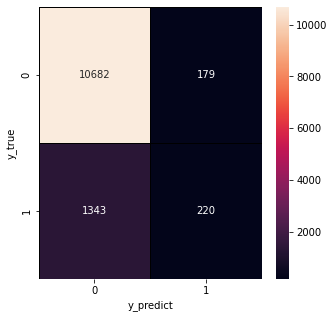

In [243]:
# LR confusion matrix
y_predict = logreg.predict(X_test)
y_true = y_test
cm = confusion_matrix (y_true,y_predict)
f, ax =plt.subplots(figsize=(5,5))
sns.heatmap(cm,annot=True,linewidths=0.5,linecolor="black",fmt=".0f",ax=ax)
plt.xlabel("y_predict")
plt.ylabel("y_true")
plt.show()

In [244]:
# logistic regression Class Weight is balanced
logreg = LogisticRegression(C=1.0, class_weight='balanced', dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
logreg.fit(X_train,y_train)
prediction = logreg.predict(X_test)

# metric computation
BalancedCleanedDataacc=np.sum((prediction==y_test))/len(y_test)
print('Accuracy after data is cleaned where Classweight is balanced: ',BalancedCleanedDataacc*100)
BalancedCleanDataCM = confusion_matrix(y_test, prediction)
print('Confusion Matrix after data is cleaned where ClassWeight is balanced: ',BalancedCleanDataCM)
Compareaccuracy.append(["Logistic Regression - Balanced Class Weight",BalancedCleanedDataacc])

Accuracy after data is cleaned where Classweight is balanced:  82.03477141017386
Confusion Matrix after data is cleaned where ClassWeight is balanced:  [[8954 1907]
 [ 325 1238]]


In [245]:
# logistic regression Solver is newton-cg
logreg = LogisticRegression(C=1.0, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=0, solver='newton-cg', tol=0.0001,
          verbose=0, warm_start=False)
logreg.fit(X_train,y_train)
prediction = logreg.predict(X_test)

# metric computation
NCGCleanedDataacc=np.sum((prediction==y_test))/len(y_test)
print('Accuracy after data is cleaned where Solver used is newton-cg:',NCGCleanedDataacc*100)
NCGCleanDataCM = confusion_matrix(y_test, prediction)
print('Confusion Matrix after data is cleaned where Solver used is newton-cg: ',NCGCleanDataCM)

Compareaccuracy.append(["Logistic Regression - Solver newton-cg",NCGCleanedDataacc])

Accuracy after data is cleaned where Solver used is newton-cg: 89.19832582099163
Confusion Matrix after data is cleaned where Solver used is newton-cg:  [[10589   272]
 [ 1070   493]]


In [246]:
# logistic regression Solver is saga
logreg = LogisticRegression(C=1.0, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=0, solver='saga', tol=0.0001,
          verbose=0, warm_start=False)
logreg.fit(X_train,y_train)
prediction = logreg.predict(X_test)
# metric computation
Sagaacc=np.sum((prediction==y_test))/len(y_test)
print('Accuracy after data is cleaned where Solver used is saga:',Sagaacc*100)
SagaCM = confusion_matrix(y_test, prediction)
print('Confusion Matrix after data is cleaned where Solver used is saga: ',SagaCM)
Compareaccuracy.append(["Logistic Regression - Solver saga",Sagaacc])

Accuracy after data is cleaned where Solver used is saga: 86.50998068254991
Confusion Matrix after data is cleaned where Solver used is saga:  [[10529   332]
 [ 1344   219]]


In [259]:
# KNN n_neighbours = 9
neigh = KNeighborsClassifier(n_neighbors=9)
neigh.fit(X_train,y_train)
#print(neigh.kneighbors(X_test, return_distance=False))
prediction=neigh.predict(X_test)
KNN1acc=np.sum((prediction==y_test))/len(y_test)
print('Accuracy after data is cleaned with KNN: ',KNN1acc*100)
Compareaccuracy.append(["KNN n_neighbours = 9",KNN1acc])

Accuracy after data is cleaned with KNN:  87.32292337411461


In [248]:
# KNN n_neighbours = 4000
neigh = KNeighborsClassifier(n_neighbors=4000)
neigh.fit(X_train,y_train)
#print(neigh.kneighbors(X_test, return_distance=False))
prediction=neigh.predict(X_test)
KNN3acc=np.sum((prediction==y_test))/len(y_test)
print('Accuracy with KNN considering n_neighbours = 4000 : ',KNN3acc*100)
Compareaccuracy.append(["KNN n_neighbours = 4000",KNN3acc])

Accuracy with KNN considering n_neighbours = 4000 :  87.41951062459755


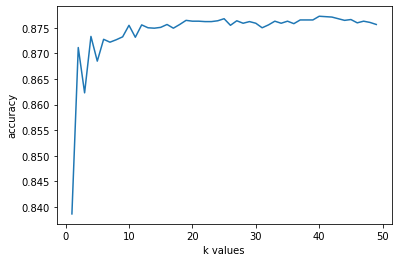

In [249]:
# Findind k values in range(1,50)
score_list = []
for each in range(1,50):
    knn2 = KNeighborsClassifier(n_neighbors = each)
    knn2.fit(X_train,y_train)
    score_list.append(knn2.score(X_test,y_test))
    
plt.plot(range(1,50),score_list)
plt.xlabel("k values")
plt.ylabel("accuracy")
plt.show()

# Considering 9 is the best k value in range(1,50) i used 9 above.

In [250]:
# Decision Tree
DTCclassifier = DecisionTreeClassifier(max_depth=3, min_samples_leaf=5, criterion='entropy', min_samples_split=5, splitter='random', random_state=1)
DTCclassifier.fit(X_train, y_train)
y_pred_DTC = DTCclassifier.predict(X_test)
DTCacc = accuracy_score(y_pred_DTC, y_test)
print('Accuracy with Decision Tree:'+'\033[1m {:.2f}%'.format(DTCacc*100))
Compareaccuracy.append(["Decision Tree",DTCacc])

Accuracy with Decision Tree: 88.58%


In [251]:
#Random Forest
RFclassifier = RandomForestClassifier(n_estimators=1000, random_state=1, max_leaf_nodes=20, min_samples_split=15)
RFclassifier.fit(X_train, y_train)
y_pred_RF = RFclassifier.predict(X_test)
RFacc = accuracy_score(y_pred_RF, y_test)
print('Accuracy with Random Forest:',RFacc*100)
Compareaccuracy.append(["Random Forest",RFacc])

Accuracy with Random Forest: 88.99710238248552


Loading And Comparing All Models

In [280]:
# Accuracy Comparison Table
compare = pd.DataFrame({'Model': ['Logistic Regression______________________',
                                  'Logistic Regression - Balanced___________', 
                                  'Logistic Regression - newton-cg__________', 
                                  'Logistic Regression - Saga_______________',
                                  'K-Nearest Neighbour - n_neighbours = 50__', 
                                  'K-Nearest Neighbour - n_neighbours = 4000', 
                                  'Decision Tree____________________________', 
                                  'Random Forest____________________________'], 'Accuracy': [CleanedDataacc*100, BalancedCleanedDataacc*100, NCGCleanedDataacc*100, Sagaacc*100, KNN1acc*100, KNN3acc*100, DTCacc*100,RFacc*100]})

compare.sort_values(by='Accuracy', ascending=False).style.background_gradient(cmap='PuRd').hide_index().set_properties(**{'font-family': 'Segoe UI'})

Model,Accuracy
Logistic Regression - newton-cg__________,89.198326
Random Forest____________________________,88.997102
Decision Tree____________________________,88.578558
Logistic Regression______________________,87.749517
K-Nearest Neighbour - n_neighbours = 4000,87.419511
K-Nearest Neighbour - n_neighbours = 50__,87.322923
Logistic Regression - Saga_______________,86.509981
Logistic Regression - Balanced___________,82.034771
